51
100
105
256


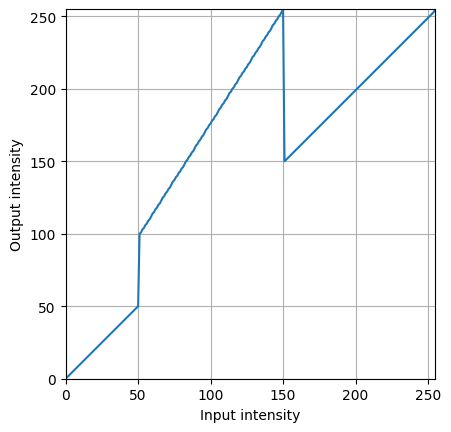

Text(0.5, 1.0, 'Transformed Image')

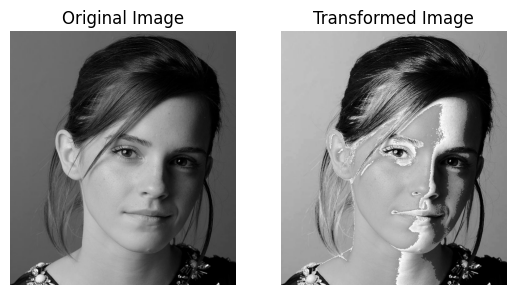

In [4]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

c=np.array([(50, 100) , (150, 255)])
t1 = np.linspace(0, c[0,0], c[0,0]+1 - 0).astype('uint8')
print(len(t1))
t2 = np.linspace(c[0,1] , c[1,1], c[1,0] - c[0,0]).astype('uint8')
print(len(t2))
t3 = np.linspace(c[1,0], 255, 255 - c[1,0]).astype('uint8')
print(len(t3))

transform = np.concatenate((t1,t2), axis = 0).astype('uint8')
transform = np.concatenate((transform,t3), axis = 0).astype('uint8')
print(len(transform))

fig, ax = plt.subplots()
ax.plot(transform)
ax.set_xlabel('Input intensity')
ax.set_ylabel('Output intensity')
ax.set_xlim(0,255)
ax.set_ylim(0,255)
ax.grid('True')
ax.set_aspect('equal')
plt.savefig('transform.png')
plt.show()

img_orig = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\emma.jpg", cv.IMREAD_GRAYSCALE)
if img_orig is None:
    print('Image could not be read.')
    assert False


# Show image using OpenCV
"""
cv.namedWindow("Image", cv.WINDOW_AUTOSIZE)
cv.imshow("Original Image", img_orig)
cv.waitKey(0)

img_transformed = cv.LUT(img_orig, transform)
cv.imshow("Transformed Image", img_transformed)
cv.waitKey(0)
cv.destroyAllWindows()
"""

#Show image using matplotlib

img_orig = cv.cvtColor(img_orig, cv.COLOR_BGR2RGB)
img_transformed = transform[img_orig]

fig, ax = plt.subplots(1,2)
fig.axes[0].set_axis_off()
fig.axes[1].set_axis_off()
ax[0].imshow(img_orig)
ax[0].set_title('Original Image')
ax[1].imshow(img_transformed)
ax[1].set_title('Transformed Image')



181
40
35
256
181
40
35
256


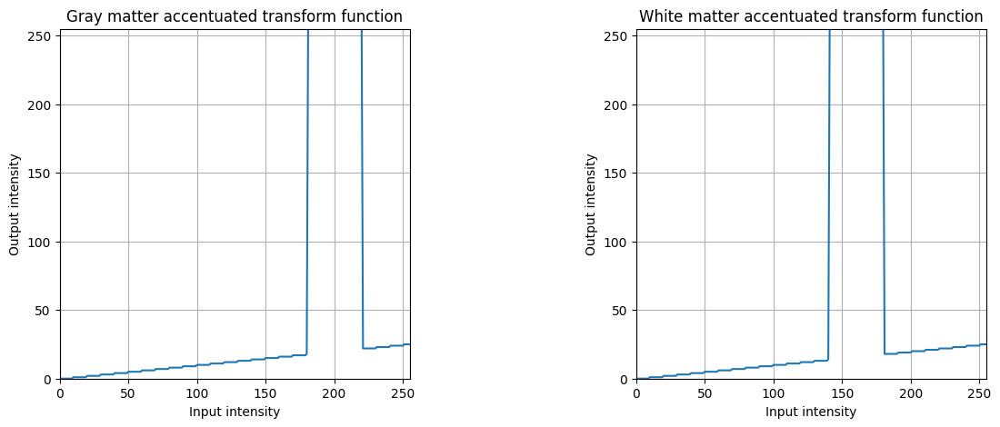

Text(0.5, 1.0, 'White matter accentuated Image')

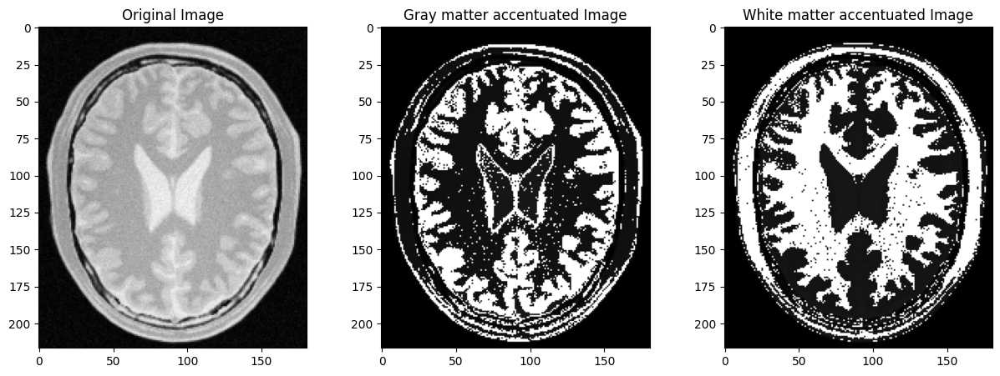

In [6]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Gray matter accentuated transform function
n = 10
enhance_down = 180
enhance_up = 220
t1 = np.linspace(0, enhance_down/n, enhance_down+1 - 0).astype('uint8')
print(len(t1))
t2 = np.linspace(255 , 255, enhance_up - enhance_down).astype('uint8')
print(len(t2))
t3 = np.linspace(enhance_up/n, 255/n, 255 - enhance_up).astype('uint8')
print(len(t3))

transform_g = np.concatenate((t1,t2), axis = 0).astype('uint8')
transform_g = np.concatenate((transform_g,t3), axis = 0).astype('uint8')
print(len(transform_g))


# White matter accentuated transform function
n = 10
enhance_down = 140
enhance_up = 180
t1_w = np.linspace(0, enhance_down/n, enhance_down+1 - 0).astype('uint8')
print(len(t1))
t2_w = np.linspace(255 , 255, enhance_up - enhance_down).astype('uint8')
print(len(t2))
t3_w = np.linspace(enhance_up/n, 255/n, 255 - enhance_up).astype('uint8')
print(len(t3))

transform_w = np.concatenate((t1_w,t2_w), axis = 0).astype('uint8')
transform_w = np.concatenate((transform_w,t3_w), axis = 0).astype('uint8')
print(len(transform_w))

# Show transform functions
fig, ax = plt.subplots(1,2, figsize=(15, 5))
ax[0].plot(transform_g)
ax[0].set_xlabel('Input intensity')
ax[0].set_ylabel('Output intensity')
ax[0].set_xlim(0,255)
ax[0].set_ylim(0,255)
ax[0].grid('True')
ax[0].set_aspect('equal')
ax[0].set_title('Gray matter accentuated transform function')

ax[1].plot(transform_w)
ax[1].set_xlabel('Input intensity')
ax[1].set_ylabel('Output intensity')
ax[1].set_xlim(0,255)
ax[1].set_ylim(0,255)
ax[1].grid('True')
ax[1].set_aspect('equal')
ax[1].set_title('White matter accentuated transform function')
plt.show()


img_orig = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\BrainProtonDensitySlice9.png", cv.IMREAD_GRAYSCALE)
if img_orig is None:
    print('Image could not be read.')
    assert False


#Show image using matplotlib

img_orig = cv.cvtColor(img_orig, cv.COLOR_BGR2RGB)
img_transformed_g = transform_g[img_orig]
img_transformed_w = transform_w[img_orig]

fig, ax = plt.subplots(1,3, figsize=(15, 5))
ax[0].imshow(img_orig)
ax[0].set_title('Original Image')
ax[1].imshow(img_transformed_g)
ax[1].set_title('Gray matter accentuated Image')
ax[2].imshow(img_transformed_w)
ax[2].set_title('White matter accentuated Image')


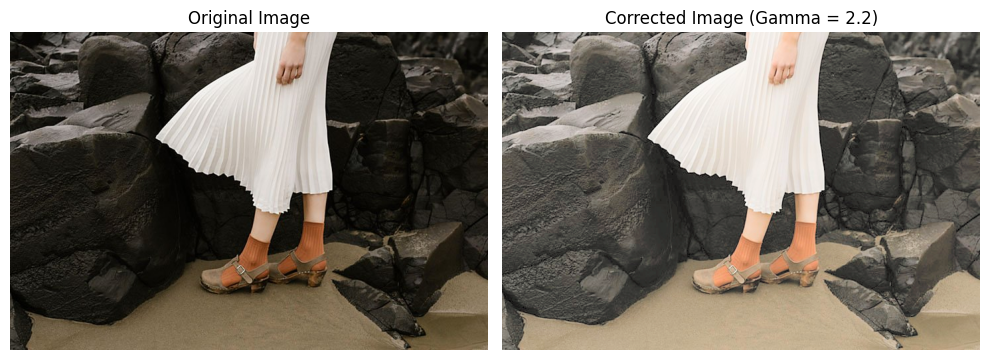

True

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an image
image = cv2.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\highlights_and_shadows.jpg")

# Convert the image to the L*a*b* color space
lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)

# Extract the L* component
L_channel = lab_image[:,:,0]

# Specify the gamma value 2.2
gamma = 2.2

# Apply gamma correction
L_corrected = np.power(L_channel / 255.0, 1.0 / gamma) * 255.0
L_corrected = np.clip(L_corrected, 0, 255).astype(np.uint8)

# Replace the original L* component with the corrected one
lab_image[:,:,0] = L_corrected

# Convert back to the BGR color space
output_image = cv2.cvtColor(lab_image, cv2.COLOR_Lab2BGR)

# Display the original and corrected images using matplotlib
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
plt.title(f"Corrected Image (Gamma = {gamma})")
plt.axis("off")

plt.tight_layout()
plt.show()

cv2.imwrite("output_image.jpg", output_image)



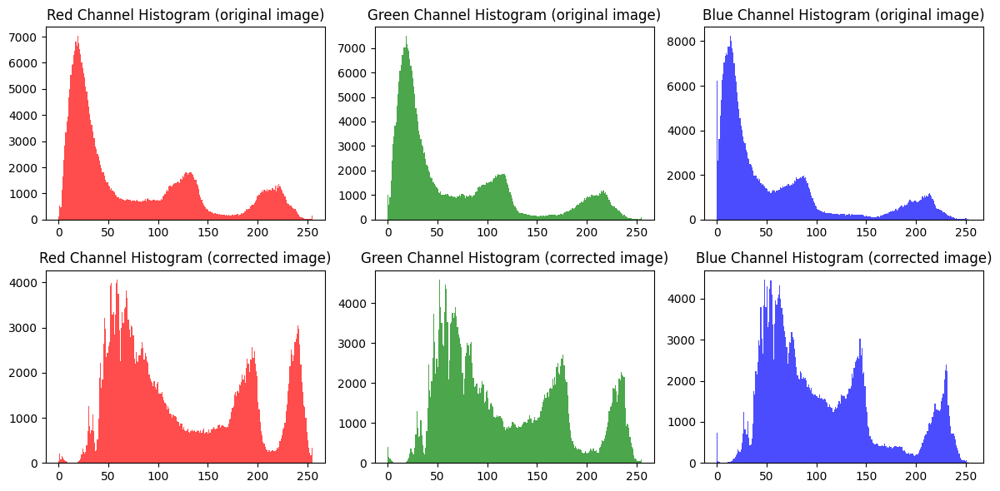

In [18]:
import cv2
import matplotlib.pyplot as plt

# Load the original color image
image_original = cv2.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\highlights_and_shadows.jpg")

# Load the corrected image
image_corrected = cv2.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\EN3160---Image-Processing-and-Machine-Vision\Assignment_01\output_image.jpg")

# Convert the image to RGB color space
image_original_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_corrected_rgb = cv2.cvtColor(image_corrected, cv2.COLOR_BGR2RGB)

# Separate color channels in original image
orig_r_channel = image_original_rgb[:,:,0]
orig_g_channel = image_original_rgb[:,:,1]
orig_b_channel = image_original_rgb[:,:,2]

# Separate color channels in corrected image
corr_r_channel = image_corrected_rgb[:,:,0]
corr_g_channel = image_corrected_rgb[:,:,1]
corr_b_channel = image_corrected_rgb[:,:,2]

# Plot histograms for each color channel
plt.figure(figsize=(12, 6))

plt.subplot(2, 3, 1)
plt.hist(orig_r_channel.ravel(), bins=256, color='red', alpha=0.7)
plt.title('Red Channel Histogram (original image)')

plt.subplot(2, 3, 2)
plt.hist(orig_g_channel.ravel(), bins=256, color='green', alpha=0.7)
plt.title('Green Channel Histogram (original image)')

plt.subplot(2, 3, 3)
plt.hist(orig_b_channel.ravel(), bins=256, color='blue', alpha=0.7)
plt.title('Blue Channel Histogram (original image)')

plt.subplot(2, 3, 4)
plt.hist(corr_r_channel.ravel(), bins=256, color='red', alpha=0.7)
plt.title('Red Channel Histogram (corrected image)')

plt.subplot(2, 3, 5)
plt.hist(corr_g_channel.ravel(), bins=256, color='green', alpha=0.7)
plt.title('Green Channel Histogram (corrected image)')

plt.subplot(2, 3, 6)
plt.hist(corr_b_channel.ravel(), bins=256, color='blue', alpha=0.7)
plt.title('Blue Channel Histogram (corrected image)')

plt.tight_layout()
plt.show()


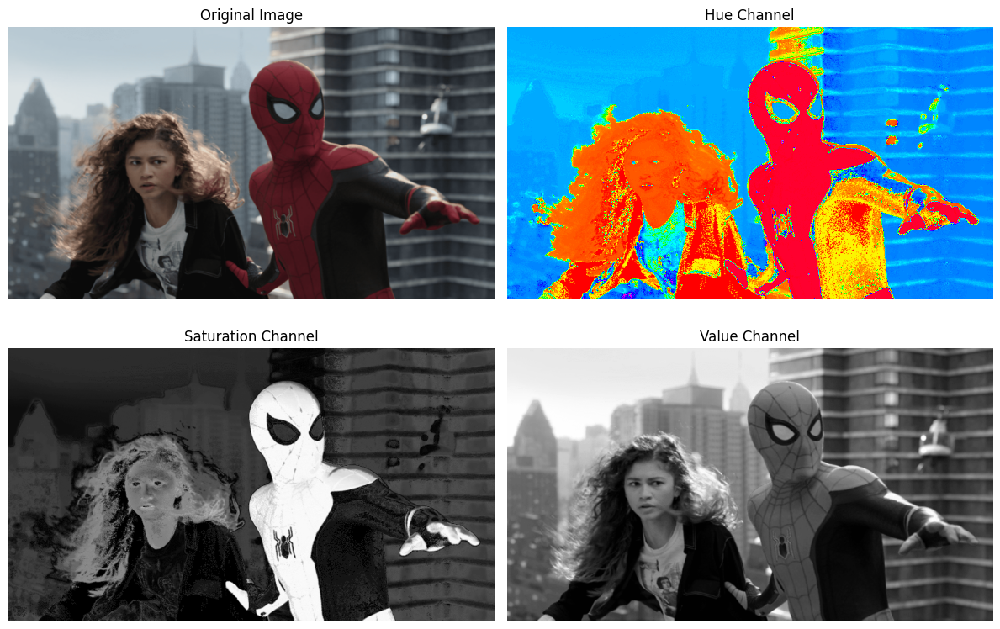

In [26]:
import cv2 as  cv
import numpy as np
import matplotlib.pyplot as plt

# Read the image
img = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\spider.png", cv.IMREAD_COLOR)

# Convert the imagr to HSV color space
hsv_img = cv.cvtColor(img, cv.COLOR_BGR2HSV)

# Split the image into 3 channels
hue_channel = hsv_img[:, :, 0]
saturation_channel = hsv_img[:, :, 1]
value_channel = hsv_img[:, :, 2]

# Display the original image and the HSV channels
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(hue_channel, cmap="hsv")
plt.title("Hue Channel")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(saturation_channel, cmap="gray")
plt.title("Saturation Channel")
plt.axis("off") 

plt.subplot(2, 2, 4)
plt.imshow(value_channel, cmap="gray")
plt.title("Value Channel")
plt.axis("off")

plt.tight_layout()
plt.show()

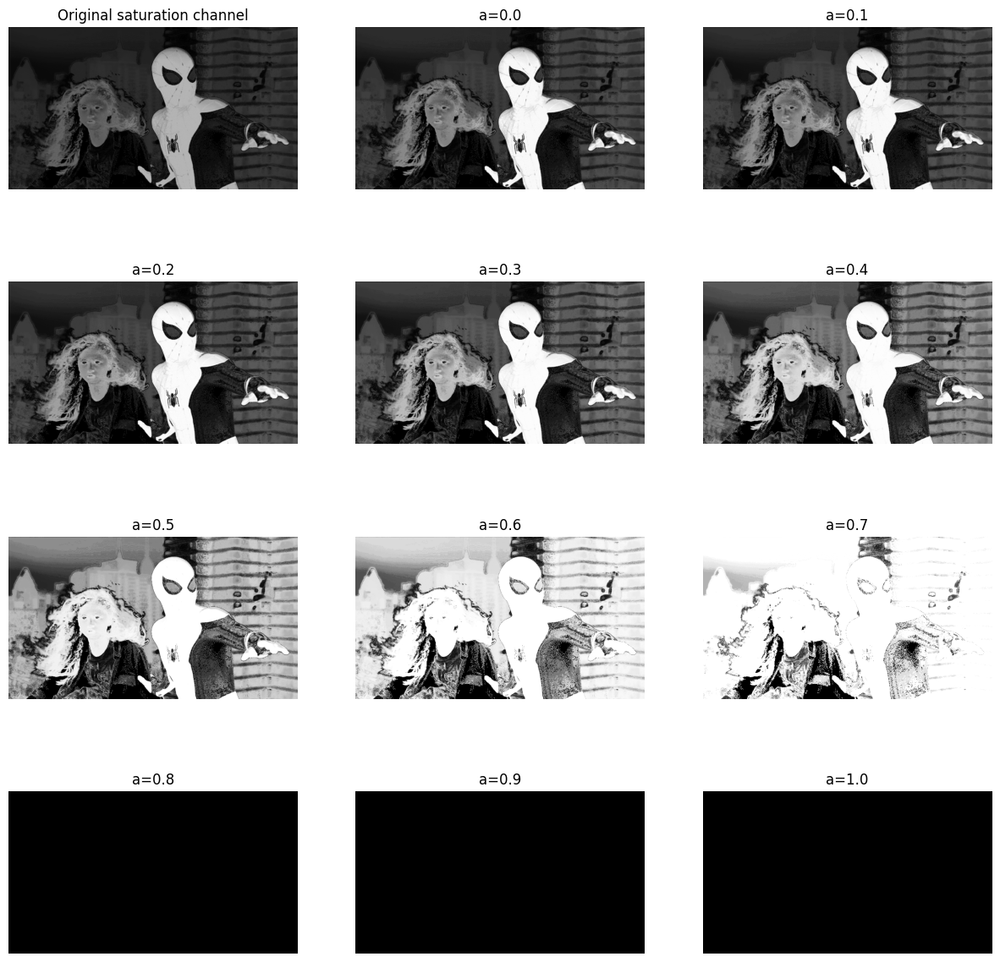

In [81]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def intensity_transformation(x,a):
    return min((x+a*128*np.exp(-((x-128)**2)/(2*(70**2)))),255)

# Read the image
img = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\spider.png", cv.IMREAD_COLOR)

# Convert the imagr to HSV color space
hsv_img = cv.cvtColor(img, cv.COLOR_BGR2HSV)

# Extract the saturation channel
saturation_channel = hsv_img[:, :, 1]

# Display the original saturation channel
plt.figure(figsize=(15, 15))
plt.subplot(4, 3, 1)
plt.title('Original saturation channel')
plt.imshow(cv.cvtColor(saturation_channel, cv.COLOR_BGR2RGB))
#plt.imshow(saturation_channel, cmap='gray')
plt.axis('off')

# Define the parameter a
for a in np.arange(0.0,1.1,0.1):

    # Apply the intensity transformation function to the saturation channel
    transformed_saturation = np.vectorize(intensity_transformation)(saturation_channel, a)

    # Replace the saturation channel with the transformed saturation channel
    hsv_img[:, :, 1] = transformed_saturation

    # Display the transformed saturation channel
    plt.subplot(4, 3, int(a * 10) + 2)
    plt.title('a=' + str(round(a,1))) 
    plt.imshow(hsv_img[:, :, 1], cmap='gray')
    plt.axis('off')

plt.show()

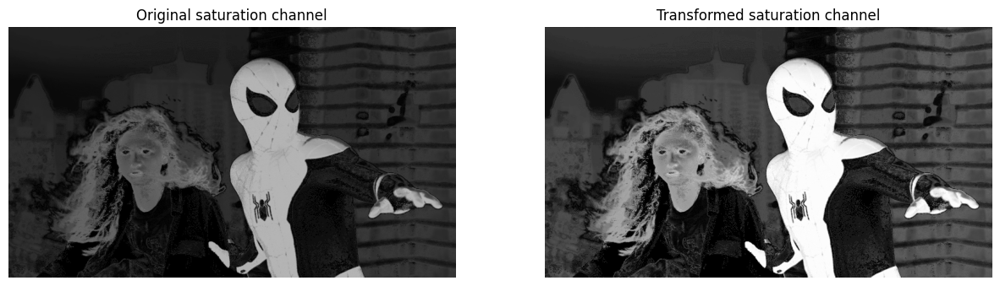

In [10]:

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def intensity_transformation(x,a):
    return min((x+a*128*np.exp(-((x-128)**2)/(2*(70**2)))),255)

# Read the image
img = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\spider.png", cv.IMREAD_COLOR)

# Convert the imagr to HSV color space
hsv_img = cv.cvtColor(img, cv.COLOR_BGR2HSV)

# Extract the saturation channel
saturation_channel = hsv_img[:, :, 1]

# Form above observation I select the parameter a = 0.4
a = 0.4

# Apply the intensity transformation function to the saturation channel
transformed_saturation = np.vectorize(intensity_transformation)(saturation_channel, a)

# Plot the original and transformed saturation channels
plt.figure(figsize=(15, 15))
plt.subplot(1, 2, 1)
plt.title('Original saturation channel')
plt.imshow(cv.cvtColor(saturation_channel, cv.COLOR_BGR2RGB))
#plt.imshow(saturation_channel, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Transformed saturation channel')
plt.imshow(transformed_saturation, cmap='gray')
plt.axis('off')

plt.show()
    

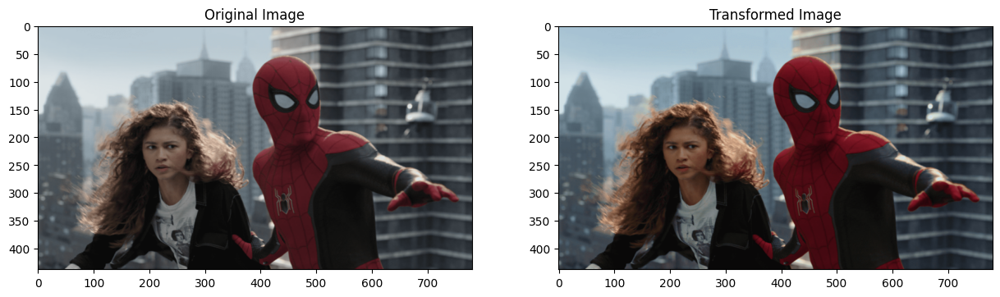

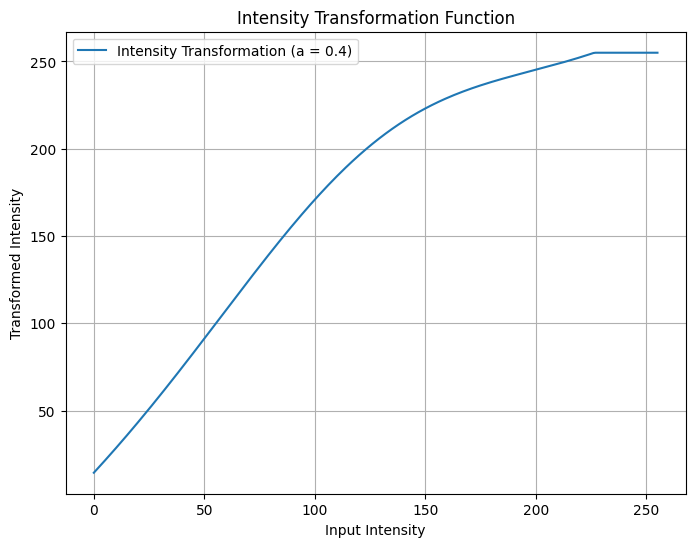

In [83]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def intensity_transformation(x,a):
    return min((x+(a*128)*np.exp(-((x-128)**2)/(2*(70**2)))),255)

# Read the image
img = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\spider.png", cv.IMREAD_COLOR)

# Display the original image
plt.figure(figsize=(15,15))

plt.subplot(1,2,1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title("Original Image")

# Convert the imagr to HSV color space
hsv_img = cv.cvtColor(img, cv.COLOR_BGR2HSV)

# Extract the saturation channel
saturation_channel = hsv_img[:, :, 1]

# Form above observation I select the parameter a = 0.4
a = 0.4

# Apply the intensity transformation function to the saturation channel
transformed_saturation = np.vectorize(intensity_transformation)(saturation_channel, a)

# Replace the saturation channel with the transformed saturation channel
hsv_img[:, :, 1] = transformed_saturation

# Convert the image back to BGR color space
transformed_img = cv.cvtColor(hsv_img, cv.COLOR_HSV2BGR)

# Display the transformed images


plt.subplot(1,2,2)
plt.imshow(cv.cvtColor(transformed_img, cv.COLOR_BGR2RGB))
plt.title("Transformed Image")


plt.show()

# Plot the intensity transformation function
x_values = np.arange(0, 256)
y_values = [intensity_transformation(x, 0.6) for x in x_values]

plt.figure(figsize=(8, 6))
plt.plot(x_values, y_values, label=f"Intensity Transformation (a = {a})")
plt.title("Intensity Transformation Function")
plt.xlabel("Input Intensity")
plt.ylabel("Transformed Intensity")
plt.legend()
plt.grid(True)
plt.show()

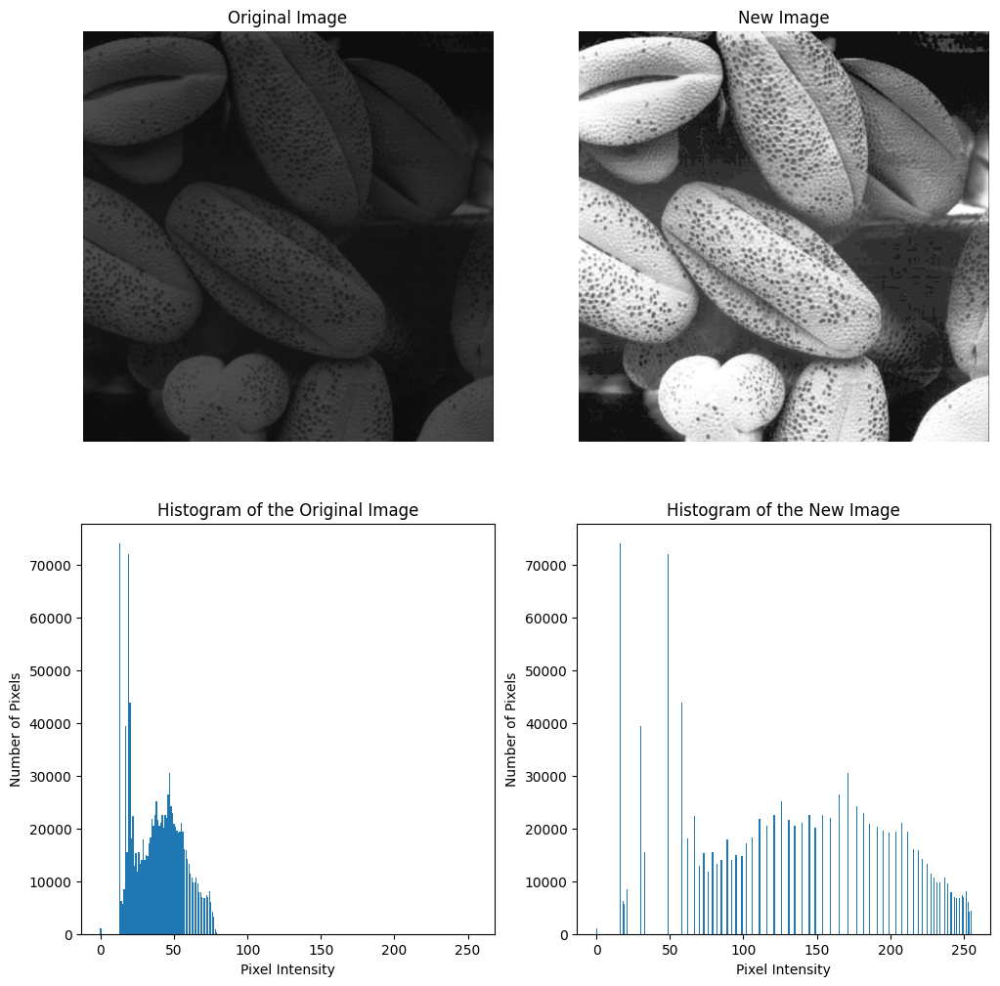

<Figure size 640x480 with 0 Axes>

In [10]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Read image
img = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\Shell.png", cv.IMREAD_GRAYSCALE)
image_size = img.size

plt.figure(figsize=(12, 12))
plt.subplot(2, 2, 1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

# Pixel intensity array
pixel_intensity = np.zeros(256)

for pixel in range(0, 256):
    # Count the number of pixels with the same intensity
    count = np.count_nonzero(img == pixel)
    # Add the number of pixels to the pixel intensity array
    pixel_intensity[pixel] = count

# Calculate the probability of each pixel intensity
probability = pixel_intensity / image_size

# Calculate the cumulative probability
cumulative_probability = np.cumsum(probability)

# Calculate the new pixel intensity
new_pixel_intensity = np.round(cumulative_probability * 255).astype(np.uint8)

# Create a new image with the new pixel intensity
new_img = np.zeros(img.shape, dtype=np.uint8)
for i in range(256):
    new_img[img == i] = new_pixel_intensity[i]

# Plot the original and new image


plt.subplot(2, 2, 2)
plt.imshow(new_img, cmap="gray")
plt.title("New Image")
plt.axis("off")

# Plot the histogram of the original image and the new image

plt.subplot(2, 2, 3)
plt.bar(np.arange(0, 256), pixel_intensity)
plt.title("Histogram of the Original Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Number of Pixels")


plt.subplot(2, 2, 4)
plt.bar(np.arange(0, 256), np.bincount(new_img.ravel()))
plt.title("Histogram of the New Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Number of Pixels")

plt.show()
plt.tight_layout()



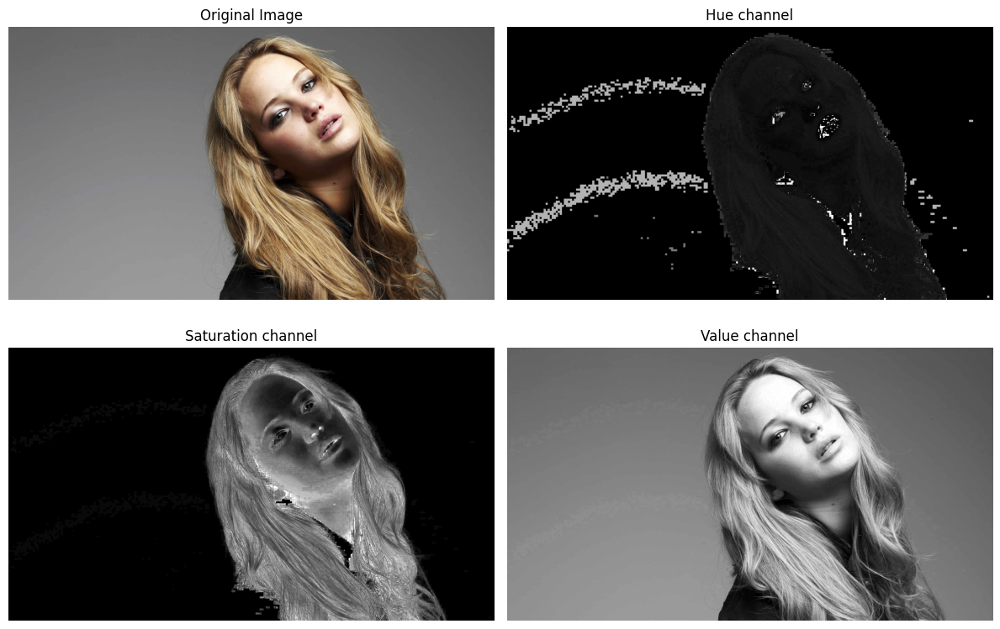

In [15]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Read image
img_orig = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\EN3160---Image-Processing-and-Machine-Vision\Assignment_01\Images\jeniffer.jpg", cv.IMREAD_COLOR)

# Convert the image into 3 channels
hsv_img_orig = cv.cvtColor(img_orig, cv.COLOR_BGR2HSV)

# Split the image into 3 channels
hue_channel = hsv_img_orig[:, :, 0]
saturation_channel = hsv_img_orig[:, :, 1]
value_channel = hsv_img_orig[:, :, 2]

# Display the original image and HSV channels
plt.figure(figsize=(12,8))

plt.subplot(2,2,1)
plt.imshow(cv.cvtColor(img_orig, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(2,2,2)
plt.imshow(hue_channel, cmap='gray')
plt.title("Hue channel")
plt.axis("off")

plt.subplot(2,2,3)
plt.imshow(saturation_channel, cmap="gray")
plt.title("Saturation channel")
plt.axis("off")

plt.subplot(2,2,4)
plt.imshow(value_channel, cmap="gray")
plt.title("Value channel")
plt.axis("off")

plt.tight_layout()
plt.show()

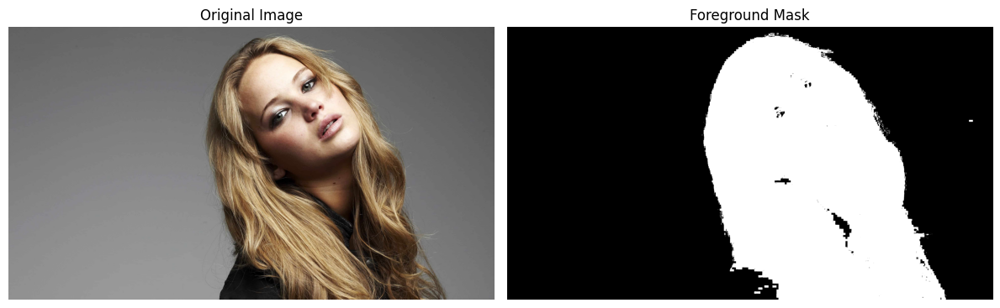

In [27]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Read image
img_orig = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\EN3160---Image-Processing-and-Machine-Vision\Assignment_01\Images\jeniffer.jpg", cv.IMREAD_COLOR)

# Convert the image into 3 channels
hsv_img_orig = cv.cvtColor(img_orig, cv.COLOR_BGR2HSV)

# Split the image into 3 channels
hue_channel = hsv_img_orig[:, :, 0]
saturation_channel = hsv_img_orig[:, :, 1]
value_channel = hsv_img_orig[:, :, 2]

# Treshold the saturation channel to extract the foreground mas
threshold = 11
_, foreground_mask = cv.threshold(saturation_channel, threshold, 255, cv.THRESH_BINARY)

# Display the original image and the foreground mask
plt.figure(figsize=(12, 8))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img_orig, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(foreground_mask, cmap="gray")
plt.title("Foreground Mask")
plt.axis("off")

plt.tight_layout()
plt.show()


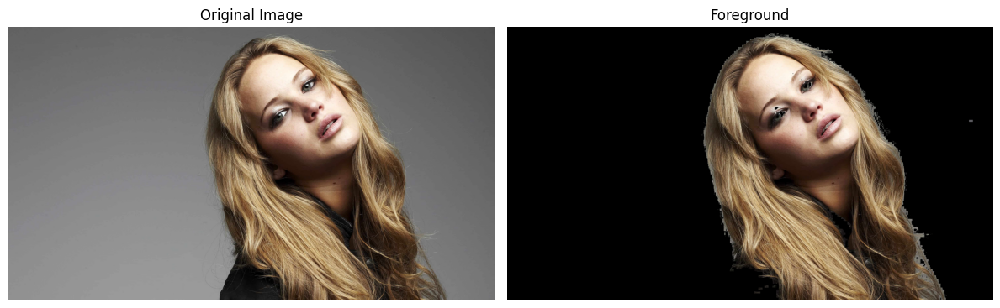

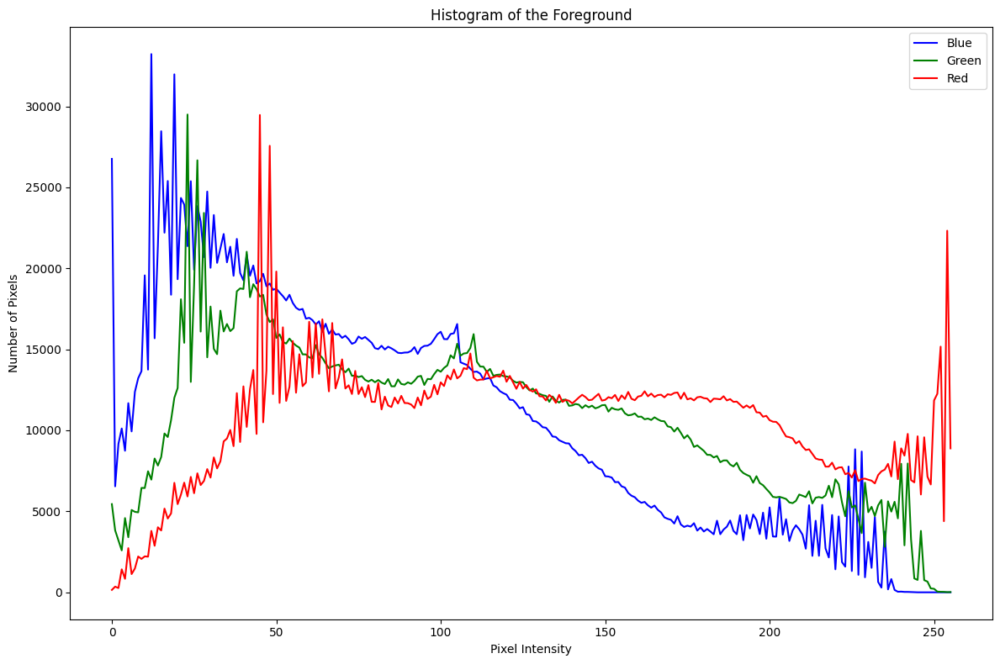

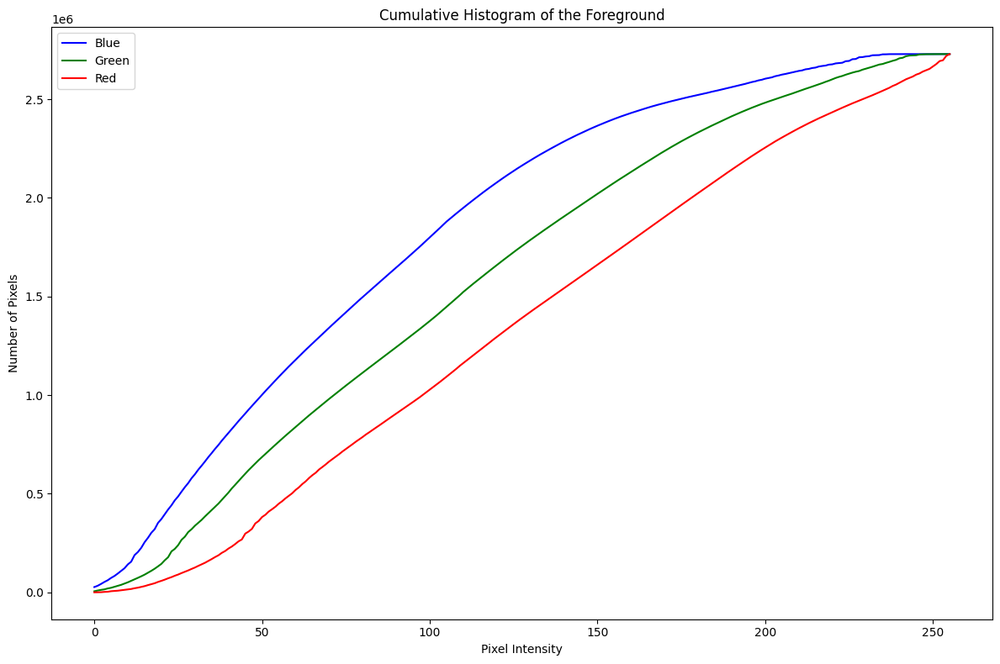

In [11]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Read image
img_orig = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\EN3160---Image-Processing-and-Machine-Vision\Assignment_01\Images\jeniffer.jpg", cv.IMREAD_COLOR)

# Convert the image into 3 channels
hsv_img_orig = cv.cvtColor(img_orig, cv.COLOR_BGR2HSV)

# Split the image into 3 channels
hue_channel = hsv_img_orig[:, :, 0]
saturation_channel = hsv_img_orig[:, :, 1]
value_channel = hsv_img_orig[:, :, 2]

# Tresholf the saturation channel to extract the foreground mas
threshold = 11
_, foreground_mask = cv.threshold(saturation_channel, threshold, 255, cv.THRESH_BINARY)

# Obtain the foreground using cv.bitwise_and,compute the histogram and display
foreground = cv.bitwise_and(img_orig, img_orig, mask=foreground_mask)

# Convert foreground to grayscale for histogram computation
# foreground = cv.cvtColor(foreground, cv.COLOR_BGR2GRAY)

# Compute the histogram of the foreground
foreground_hist_blue = cv.calcHist([foreground], [0], foreground_mask, [256], [0, 256])
foreground_hist_green = cv.calcHist([foreground], [1], foreground_mask, [256], [0, 256])
foreground_hist_red = cv.calcHist([foreground], [2], foreground_mask, [256], [0, 256])

# Obtain the cumulative sum of the histogram
cumulative_hist_blue = np.cumsum(foreground_hist_blue)
cumulative_hist_green = np.cumsum(foreground_hist_green)
cumulative_hist_red = np.cumsum(foreground_hist_red)

# Display only the foreground
plt.figure(figsize=(12, 8))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img_orig, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
plt.title("Foreground")
plt.axis("off")

plt.tight_layout()
plt.show()

# Display the histogram of the foreground and the cumulative histogram
plt.figure(figsize=(12, 8))
plt.plot(foreground_hist_blue, color="blue")
plt.plot(foreground_hist_green, color="green")
plt.plot(foreground_hist_red, color="red")
plt.title("Histogram of the Foreground")
plt.xlabel("Pixel Intensity")
plt.ylabel("Number of Pixels")
plt.legend(["Blue", "Green", "Red"])
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
plt.plot(cumulative_hist_blue, color="blue")
plt.plot(cumulative_hist_green, color="green")
plt.plot(cumulative_hist_red, color="red")
plt.title("Cumulative Histogram of the Foreground")
plt.xlabel("Pixel Intensity")
plt.ylabel("Number of Pixels")
plt.legend(["Blue", "Green", "Red"])

plt.tight_layout()
plt.show()



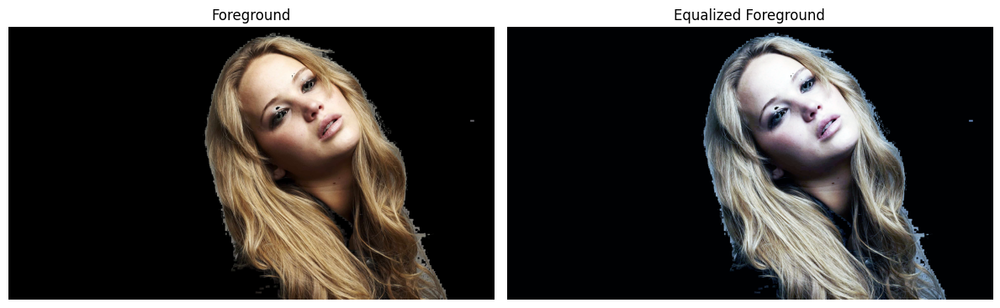

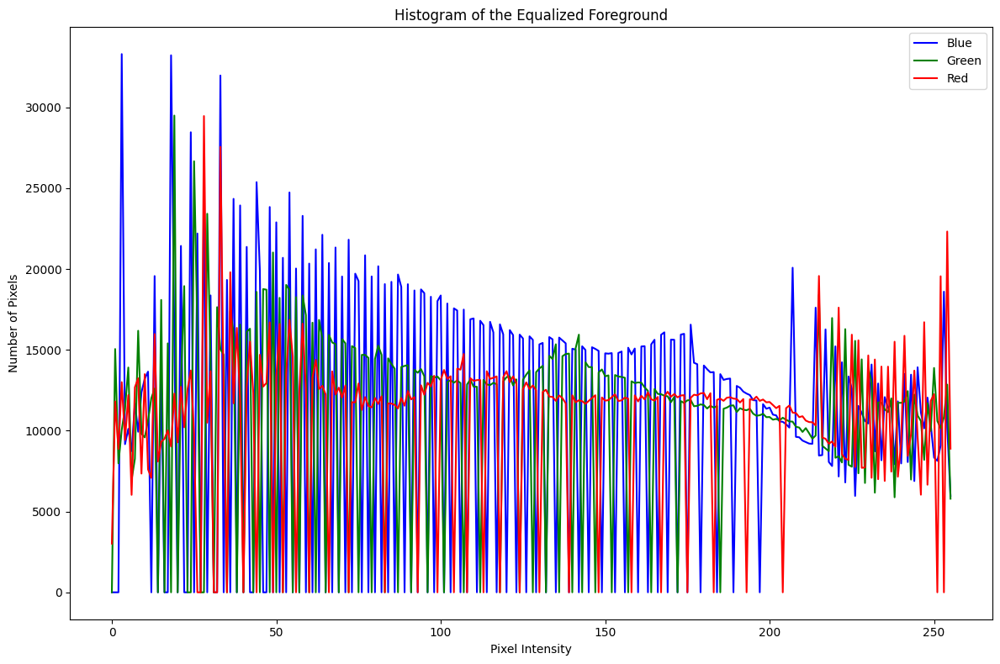

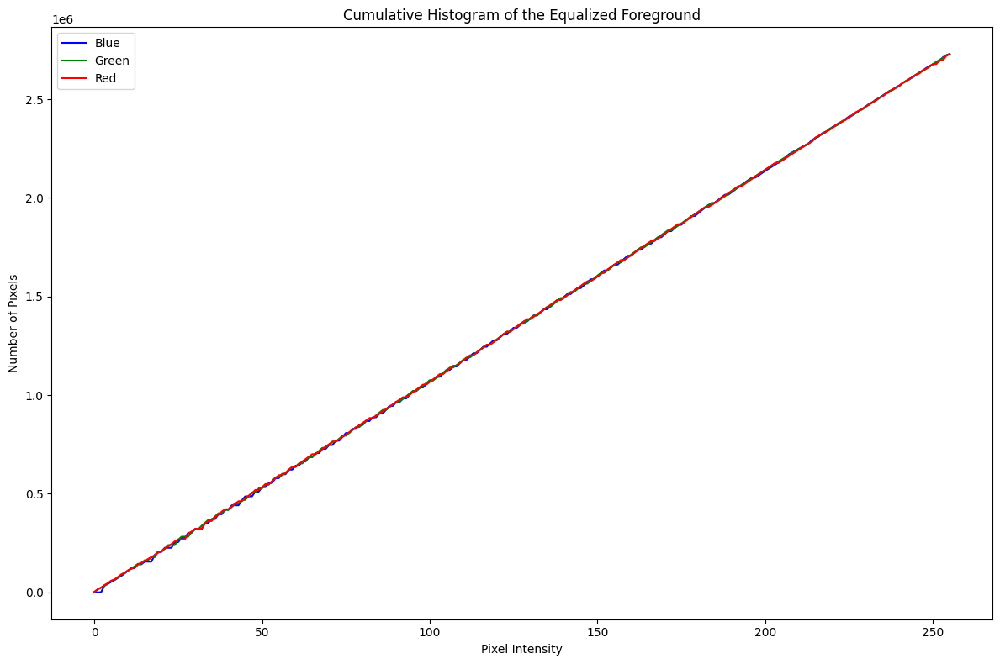

In [15]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Read image
img_orig = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\EN3160---Image-Processing-and-Machine-Vision\Assignment_01\Images\jeniffer.jpg", cv.IMREAD_COLOR)

# Convert the image into 3 channels
hsv_img_orig = cv.cvtColor(img_orig, cv.COLOR_BGR2HSV)

# Split the image into 3 channels
hue_channel = hsv_img_orig[:, :, 0]
saturation_channel = hsv_img_orig[:, :, 1]
value_channel = hsv_img_orig[:, :, 2]

# Tresholf the saturation channel to extract the foreground mas
threshold = 11
_, foreground_mask = cv.threshold(saturation_channel, threshold, 255, cv.THRESH_BINARY)

# Obtain the foreground using cv.bitwise_and,compute the histogram and display
foreground = cv.bitwise_and(img_orig, img_orig, mask=foreground_mask)

# Convert foreground to grayscale for histogram computation
# foreground = cv.cvtColor(foreground, cv.COLOR_BGR2GRAY)

# Compute the histogram of the foreground
foreground_hist_blue = cv.calcHist([foreground], [0], foreground_mask, [256], [0, 256])
foreground_hist_green = cv.calcHist([foreground], [1], foreground_mask, [256], [0, 256])
foreground_hist_red = cv.calcHist([foreground], [2], foreground_mask, [256], [0, 256])

# Obtain the cumulative sum of the histogram
cumulative_hist_blue = np.cumsum(foreground_hist_blue)
cumulative_hist_green = np.cumsum(foreground_hist_green)
cumulative_hist_red = np.cumsum(foreground_hist_red)

# Histogram equalization = Cumulative probability * 255
transformed_hist_blue = np.round(cumulative_hist_blue * 255 / cumulative_hist_blue[-1]).astype(np.uint8)
transformed_hist_green = np.round(cumulative_hist_green * 255 / cumulative_hist_green[-1]).astype(np.uint8)
transformed_hist_red = np.round(cumulative_hist_red * 255 / cumulative_hist_red[-1]).astype(np.uint8)

# Create a new image with the new pixel intensity
eqz_foreground = np.zeros(img_orig.shape, dtype=np.uint8)
for i in range(256):
    eqz_foreground[(foreground[:, :, 0] == i), 0] = transformed_hist_blue[i]
    eqz_foreground[(foreground[:, :, 1] == i), 1] = transformed_hist_green[i]
    eqz_foreground[(foreground[:, :, 2] == i), 2] = transformed_hist_red[i]


# Display the forground and equalized foreground
plt.figure(figsize=(12, 8))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(foreground, cv.COLOR_BGR2RGB))
plt.title("Foreground")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(eqz_foreground, cv.COLOR_BGR2RGB))
plt.title("Equalized Foreground")
plt.axis("off")

plt.tight_layout()
plt.show()

# Compute the histogram of the equalized foreground
eqz_foreground_hist_blue = cv.calcHist([eqz_foreground], [0], foreground_mask, [256], [0, 256])
eqz_foreground_hist_green = cv.calcHist([eqz_foreground], [1], foreground_mask, [256], [0, 256])
eqz_foreground_hist_red = cv.calcHist([eqz_foreground], [2], foreground_mask, [256], [0, 256])

# Obtain the cumulative sum of the histogram
eqz_cumulative_hist_blue = np.cumsum(eqz_foreground_hist_blue)
eqz_cumulative_hist_green = np.cumsum(eqz_foreground_hist_green)
eqz_cumulative_hist_red = np.cumsum(eqz_foreground_hist_red)

# Display the histogram of the equalized foreground and the cumulative histogram
plt.figure(figsize=(12, 8))
plt.plot(eqz_foreground_hist_blue, color="blue")
plt.plot(eqz_foreground_hist_green, color="green")
plt.plot(eqz_foreground_hist_red, color="red")
plt.title("Histogram of the Equalized Foreground")
plt.xlabel("Pixel Intensity")
plt.ylabel("Number of Pixels")
plt.legend(["Blue", "Green", "Red"])
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 8))
plt.plot(eqz_cumulative_hist_blue, color="blue")
plt.plot(eqz_cumulative_hist_green, color="green")
plt.plot(eqz_cumulative_hist_red, color="red")
plt.title("Cumulative Histogram of the Equalized Foreground")
plt.xlabel("Pixel Intensity")
plt.ylabel("Number of Pixels")
plt.legend(["Blue", "Green", "Red"])

plt.tight_layout()
plt.show()

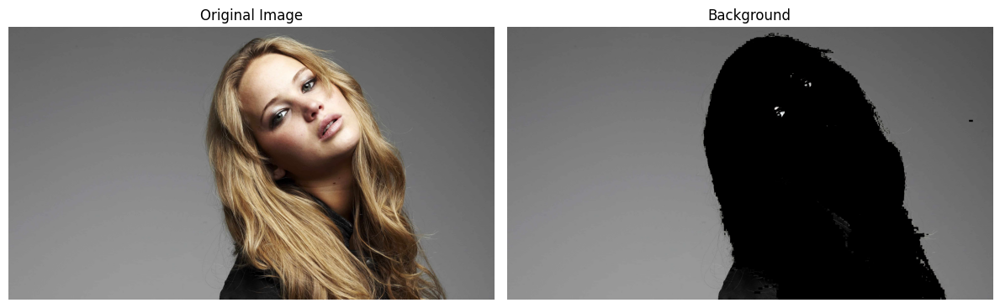

In [65]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Read image
img_orig = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\EN3160---Image-Processing-and-Machine-Vision\Assignment_01\Images\jeniffer.jpg", cv.IMREAD_COLOR)


# Extract the background from the original image
background = cv.bitwise_and(img_orig, img_orig, mask=cv.bitwise_not(foreground_mask))

# Display the background 
plt.figure(figsize=(12, 8))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img_orig, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(background, cv.COLOR_BGR2RGB))
plt.title("Background")
plt.axis("off")

plt.tight_layout()
plt.show()

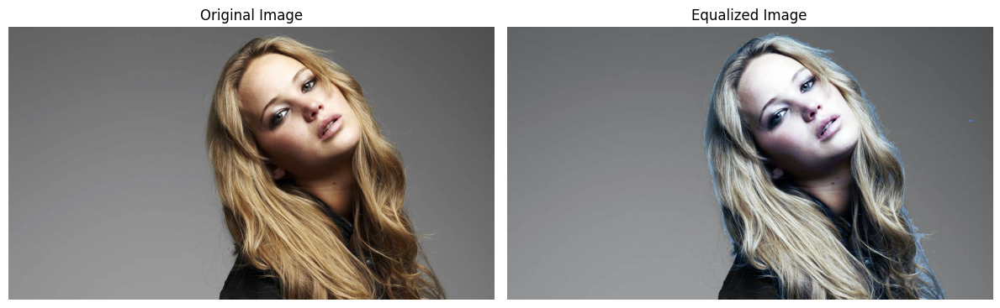

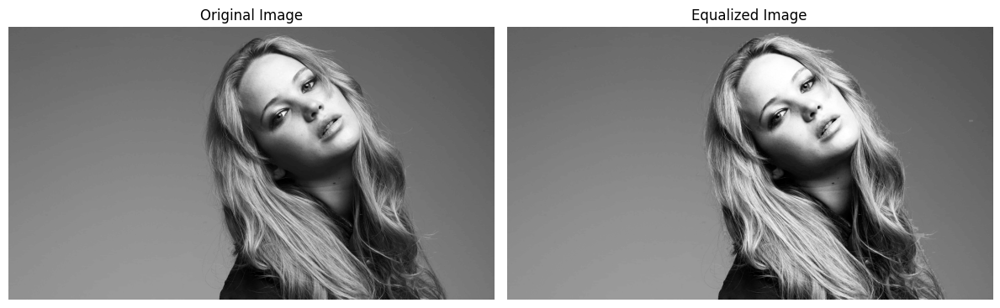

In [67]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Read image
img_orig = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\EN3160---Image-Processing-and-Machine-Vision\Assignment_01\Images\jeniffer.jpg", cv.IMREAD_COLOR)

# Convert the image into 3 channels
hsv_img_orig = cv.cvtColor(img_orig, cv.COLOR_BGR2HSV)

# Split the image into 3 channels
hue_channel = hsv_img_orig[:, :, 0]
saturation_channel = hsv_img_orig[:, :, 1]
value_channel = hsv_img_orig[:, :, 2]

# Treshold the saturation channel to extract the foreground mas
threshold = 11
_, foreground_mask = cv.threshold(saturation_channel, threshold, 255, cv.THRESH_BINARY)

# Obtain the foreground using cv.bitwise_and,compute the histogram and display
foreground = cv.bitwise_and(img_orig, img_orig, mask=foreground_mask)

# Convert foreground to grayscale for histogram computation
# foreground = cv.cvtColor(foreground, cv.COLOR_BGR2GRAY)

# Compute the histogram of the foreground
foreground_hist_blue = cv.calcHist([foreground], [0], foreground_mask, [256], [0, 256])
foreground_hist_green = cv.calcHist([foreground], [1], foreground_mask, [256], [0, 256])
foreground_hist_red = cv.calcHist([foreground], [2], foreground_mask, [256], [0, 256])

# Obtain the cumulative sum of the histogram
cumulative_hist_blue = np.cumsum(foreground_hist_blue)
cumulative_hist_green = np.cumsum(foreground_hist_green)
cumulative_hist_red = np.cumsum(foreground_hist_red)

# Histogram equalization = Cumulative probability * 255
transformed_hist_blue = np.round(cumulative_hist_blue * 255 / cumulative_hist_blue[-1]).astype(np.uint8)
transformed_hist_green = np.round(cumulative_hist_green * 255 / cumulative_hist_green[-1]).astype(np.uint8)
transformed_hist_red = np.round(cumulative_hist_red * 255 / cumulative_hist_red[-1]).astype(np.uint8)

# Create a new image with the new pixel intensity
eqz_foreground = np.zeros(img_orig.shape, dtype=np.uint8)
for i in range(256):
    eqz_foreground[(foreground[:, :, 0] == i), 0] = transformed_hist_blue[i]
    eqz_foreground[(foreground[:, :, 1] == i), 1] = transformed_hist_green[i]
    eqz_foreground[(foreground[:, :, 2] == i), 2] = transformed_hist_red[i]

# Extract the background from the original image
background = cv.bitwise_and(img_orig, img_orig, mask=cv.bitwise_not(foreground_mask))

# Combine the equalized foreground and the background
eqz_img = cv.add(eqz_foreground, background)

# Display the original image and the equalized image
plt.figure(figsize=(12, 8))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img_orig, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(eqz_img, cv.COLOR_BGR2RGB))
plt.title("Equalized Image")
plt.axis("off")

plt.tight_layout()
plt.show()

# Display equalized image and original image in grayscale
plt.figure(figsize=(12, 8))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(img_orig, cv.COLOR_BGR2GRAY), cmap="gray")
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(eqz_img, cv.COLOR_BGR2GRAY), cmap="gray")
plt.title("Equalized Image")
plt.axis("off")

plt.tight_layout()
plt.show()

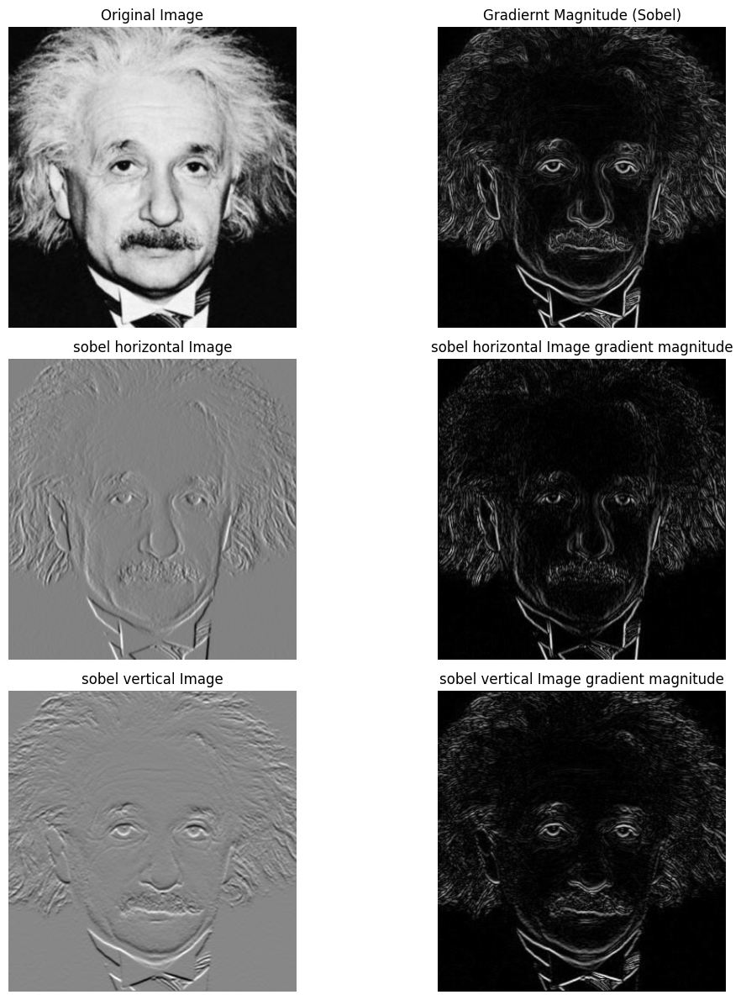

In [18]:
# Filtering with Sobel operator using filter2D function

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Read the image
img = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\einstein.png", cv.IMREAD_GRAYSCALE)

# Apply Sobel filter using filter2D
sobel_x = cv.filter2D(img, cv.CV_64F, np.array([[-1,0,1], [-2,0,2], [-1,0,1]]))
sobel_y = cv.filter2D(img, cv.CV_64F, np.array([[-1,-2,-1], [0,0,0], [1,2,1]]))

# Compute the gradient magnitude
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
gradient_magnitude_x = np.sqrt(sobel_x**2)
gradient_magnitude_y = np.sqrt(sobel_y**2)


# Display the original image and gradient magnitude
plt.figure(figsize=(12, 12))

plt.subplot(3,2,1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(3,2,2)
plt.imshow(gradient_magnitude, cmap = 'gray')
plt.title('Gradiernt Magnitude (Sobel)')
plt.axis("off")

plt.subplot(3,2,3)
plt.imshow(sobel_x, cmap='gray')
plt.title('sobel horizontal Image')
plt.axis('off')

plt.subplot(3,2,5)
plt.imshow(sobel_y, cmap='gray')
plt.title('sobel vertical Image')
plt.axis('off')

plt.subplot(3,2,4)
plt.imshow(gradient_magnitude_x, cmap='gray')
plt.title('sobel horizontal Image gradient magnitude')
plt.axis('off')

plt.subplot(3,2,6)
plt.imshow(gradient_magnitude_y, cmap='gray')
plt.title('sobel vertical Image gradient magnitude')
plt.axis('off')

plt.tight_layout()
plt.show()

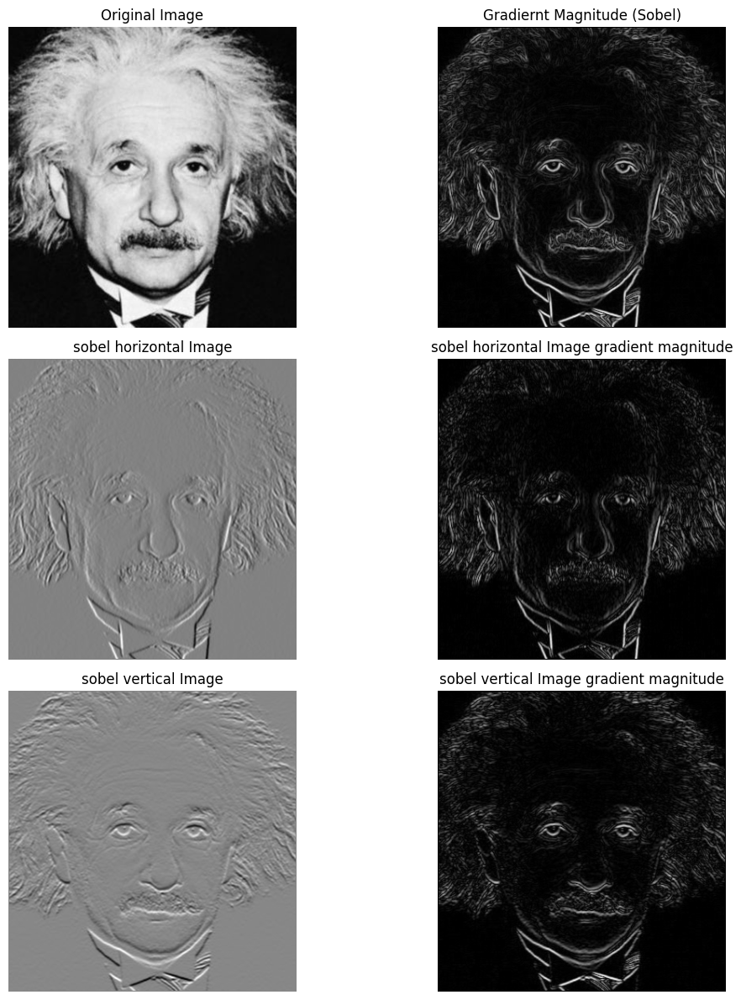

In [25]:
# Filtering with Sobel operator with my own code

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Read the image
img = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\einstein.png", cv.IMREAD_GRAYSCALE)

# Apply Sobel filter using filter2D
#sobel_x = np.array([[-1,0,1], [-2,0,2], [-1,0,1]], dtype='float')
#sobel_y = np.array([[-1,-2,-1], [0,0,0], [1,2,1]], dtype='float')

# Apply sobel filter to the image in x and y direction iteratively
sobel_x_img = np.zeros(img.shape, dtype='float')
sobel_y_img = np.zeros(img.shape, dtype='float')

for i in range(1, img.shape[0]-1):
    for j in range(1, img.shape[1]-1):
        sobel_x_img[i,j] = np.sum(np.multiply(img[i-1:i+2, j-1:j+2], sobel_x))
        sobel_y_img[i,j] = np.sum(np.multiply(img[i-1:i+2, j-1:j+2], sobel_y))

# Compute the gradient magnitude
gradient_magnitude = np.sqrt(sobel_x_img**2 + sobel_y_img**2)
gradient_magnitude_x = np.sqrt(sobel_x_img**2)
gradient_magnitude_y = np.sqrt(sobel_y_img**2)

# Display the original image and gradient magnitude
plt.figure(figsize=(12, 12))

plt.subplot(3,2,1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(3,2,2)
plt.imshow(gradient_magnitude, cmap = 'gray')
plt.title('Gradiernt Magnitude (Sobel)')
plt.axis("off")

plt.subplot(3,2,3)
plt.imshow(sobel_x_img, cmap='gray')
plt.title('sobel horizontal Image')
plt.axis('off')

plt.subplot(3,2,4)
plt.imshow(gradient_magnitude_x, cmap='gray')
plt.title('sobel horizontal Image gradient magnitude')
plt.axis('off')

plt.subplot(3,2,5)
plt.imshow(sobel_y_img, cmap='gray')
plt.title('sobel vertical Image')
plt.axis('off')

plt.subplot(3,2,6)
plt.imshow(gradient_magnitude_y, cmap='gray')
plt.title('sobel vertical Image gradient magnitude')
plt.axis('off')

plt.tight_layout()
plt.show()

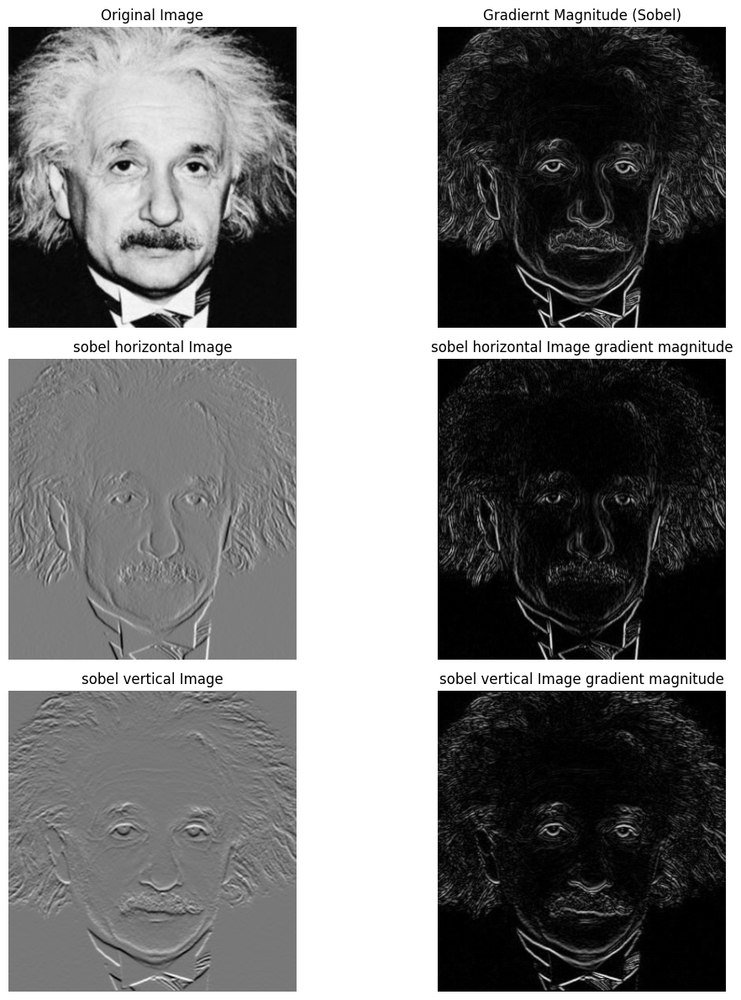

In [26]:
# Filtering with Sobel operator using Matrix multiplication property

import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Read the image
img = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\einstein.png", cv.IMREAD_GRAYSCALE)

# Apply Sobel filter for x direction using filter2D
#sobel_x_vertical = np.array([[1], [2], [1]], dtype='float')
#sobel_x_horizontal = np.array([[1, 0, -1]], dtype='float')

vertical_x_result = cv.filter2D(img, cv.CV_64F, sobel_x_vertical)
sobel_filtered_x = cv.filter2D(vertical_x_result, cv.CV_64F, sobel_x_horizontal)

# Apply Sobel filter for y direction using filter2D
sobel_y_vertical = np.array([[1], [0], [-1]], dtype='float')
sobel_y_horizontal = np.array([[1, 2, 1]], dtype='float')

horizontal_y_result = cv.filter2D(img, cv.CV_64F, sobel_y_horizontal)
sobel_filtered_y = cv.filter2D(horizontal_y_result, cv.CV_64F, sobel_y_vertical)

# Compute the gradient magnitude
gradient_magnitude = np.sqrt(sobel_filtered_x**2 + sobel_filtered_y**2)
gradient_magnitude_x = np.sqrt(sobel_filtered_x**2)
gradient_magnitude_y = np.sqrt(sobel_filtered_y**2)

# Display the original image and gradient magnitude
plt.figure(figsize=(12, 12))

plt.subplot(3,2,1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(3,2,2)
plt.imshow(gradient_magnitude, cmap = 'gray')
plt.title('Gradiernt Magnitude (Sobel)')
plt.axis("off")

plt.subplot(3,2,3)
plt.imshow(sobel_filtered_x, cmap='gray')
plt.title('sobel horizontal Image')
plt.axis('off')

plt.subplot(3,2,4)
plt.imshow(gradient_magnitude_x, cmap='gray')
plt.title('sobel horizontal Image gradient magnitude')
plt.axis('off')

plt.subplot(3,2,5)
plt.imshow(sobel_filtered_y, cmap='gray')
plt.title('sobel vertical Image')
plt.axis('off')

plt.subplot(3,2,6)
plt.imshow(gradient_magnitude_y, cmap='gray')
plt.title('sobel vertical Image gradient magnitude')
plt.axis('off')

plt.tight_layout()
plt.show()



img.shape:  (300, 480, 3)
original_image.shape:  (1200, 1920, 3)
Zoomed image size (nni):  (1200, 1920, 3)
Zoomed image size (bli):  (1200, 1920, 3)


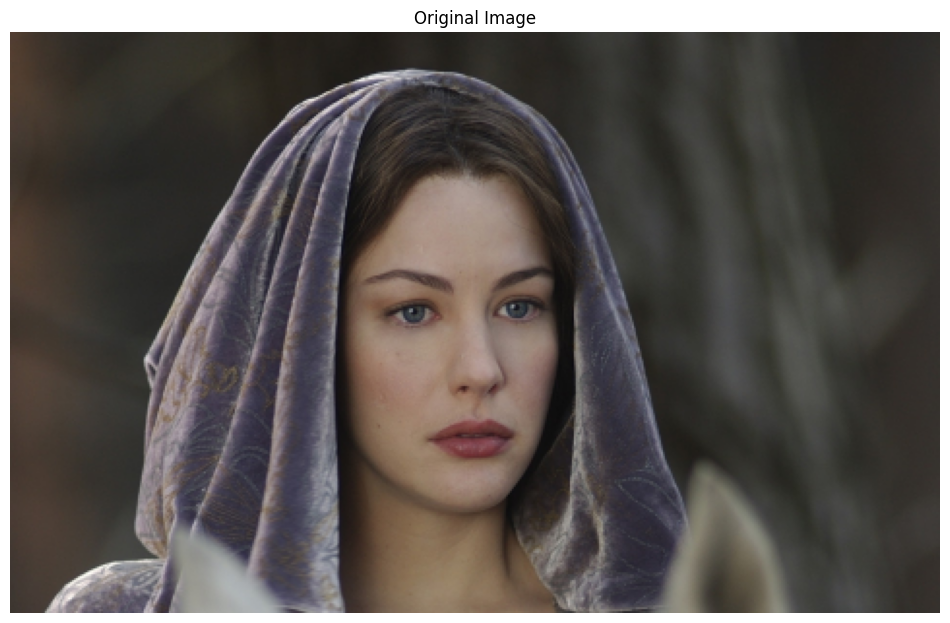

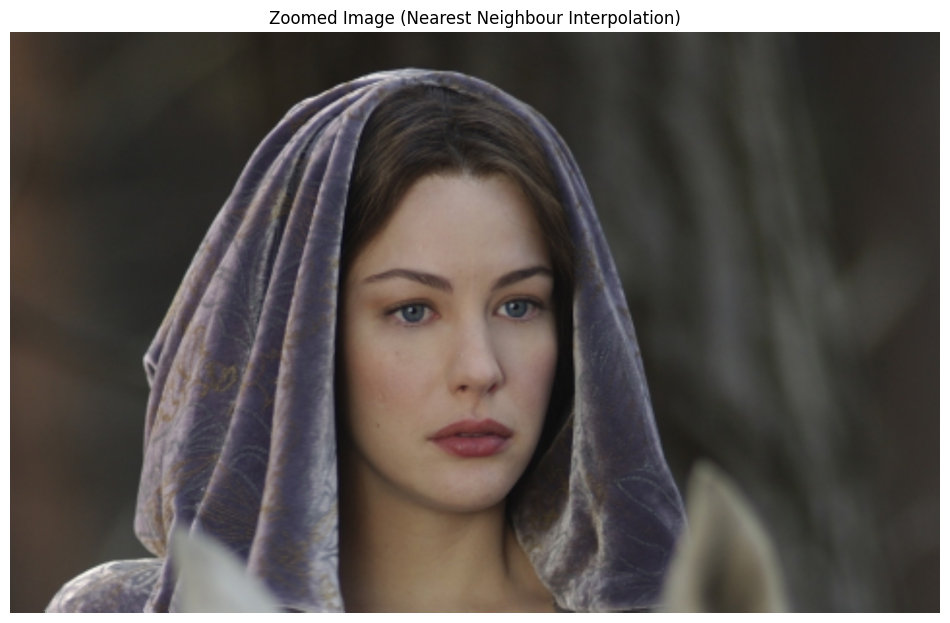

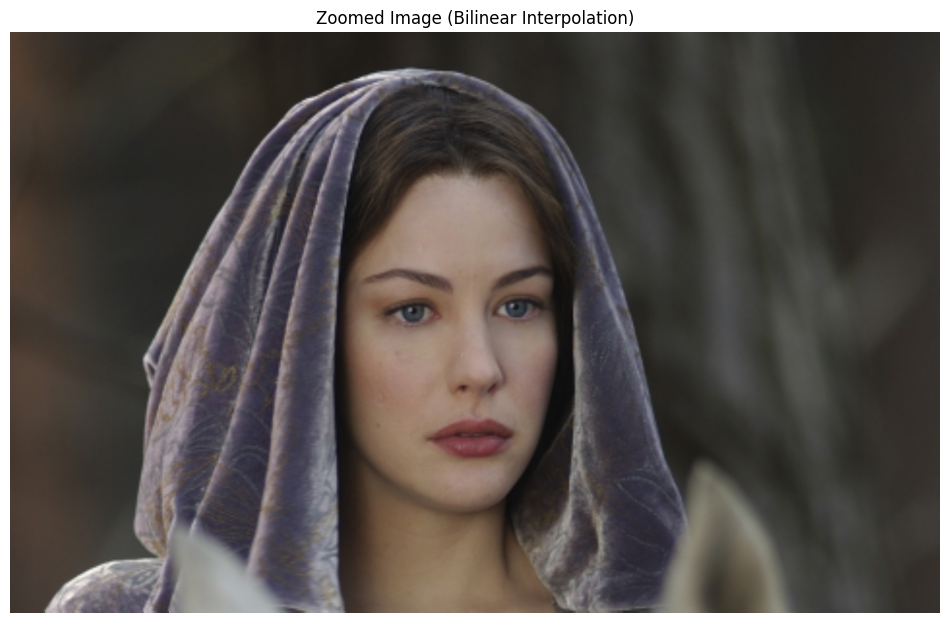

Normalized SSD (Nearest Neighbour Interpolation):  16.20416898148148
Normalized SSD (Bilinear Interpolation):  16.20416898148148


In [31]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Function to zoom image by using nearest neighbour interpolation
def zoom_nearest_neighbour(img,new_img,new_img_height,new_img_width,zoom_factor):
    for i in range(new_img_height):
        for j in range(new_img_width):
            new_img[i,j] = img[int(i/zoom_factor),int(j/zoom_factor)]
    return new_img

def zoom_bilinear_interpolation(img,new_img,new_img_height,new_img_width,zoom_factor):
    for i in range(new_img_height):
        for j in range(new_img_width):
            x = int(i/zoom_factor)
            y = int(j/zoom_factor)
            a = i/zoom_factor - x
            b = j/zoom_factor - y
            if x == img.shape[0]-1 or y == img.shape[1]-1:
                new_img[i,j] = img[x,y]
            else:
                new_img[i,j] = (1-a)*(1-b)*img[x,y] + (1-a)*b*img[x,y+1] + a*(1-b)*img[x+1,y] + a*b*img[x+1,y+1]
    return new_img

# import image
img = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\zooming\zooming\im02small.png", cv.IMREAD_COLOR)
print("img.shape: ", img.shape)
original_image = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\zooming\zooming\im02.png", cv.IMREAD_COLOR)
print("original_image.shape: ", original_image.shape)

# Define the zoom factor
zoom_factor = 4

# Define the new image size
new_img_size = (img.shape[0] * zoom_factor, img.shape[1] * zoom_factor, img.shape[2])
new_img_height = new_img_size[0]
new_img_width = new_img_size[1]

# Create a new image with the new size
new_img = np.zeros(new_img_size, dtype=np.uint8)

# Zoom the image using nearest neighbour interpolation
new_image_nni = zoom_nearest_neighbour(img,new_img,new_img_height,new_img_width,zoom_factor)

# Zoom the image using bilinear interpolation
new_image_bli = zoom_bilinear_interpolation(img,new_img,new_img_height,new_img_width,zoom_factor)

# Print details of the original and zoomed images
print("Zoomed image size (nni): ", new_image_nni.shape)
print("Zoomed image size (bli): ", new_image_bli.shape)

# Display the original and zoomed images
plt.figure(figsize=(12, 12))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")
plt.show()

plt.figure(figsize=(12, 12))
plt.imshow(cv.cvtColor(new_image_nni, cv.COLOR_BGR2RGB))
plt.title("Zoomed Image (Nearest Neighbour Interpolation)")
plt.axis("off")
plt.show()

plt.figure(figsize=(12, 12))
plt.imshow(cv.cvtColor(new_image_bli, cv.COLOR_BGR2RGB))
plt.title("Zoomed Image (Bilinear Interpolation)")
plt.axis("off")
plt.show()

'''# compute the normalized sum of squared difference (SSD) between the original and zoomed images
ssd_nni = np.sum((original_image - new_image_nni)**2) / (original_image.shape[0] * original_image.shape[1])
ssd_bli = np.sum((original_image - new_image_bli)**2) / (original_image.shape[0] * original_image.shape[1])'''

# compute the sum of squared difference (SSD) between the original and zoomed images
ssd_nni = np.sum((original_image - new_image_nni)**2)
ssd_bli = np.sum((original_image - new_image_bli)**2)

# Normalize the SSD by the total number of pixels
num_pixels = original_image.shape[0] * original_image.shape[1] * original_image.shape[2]  # Total number of pixels
ssd_nni_normalized = ssd_nni / num_pixels
ssd_bli_normalized = ssd_bli / num_pixels

print("Normalized SSD (Nearest Neighbour Interpolation): ", ssd_nni_normalized)
print("Normalized SSD (Bilinear Interpolation): ", ssd_bli_normalized)




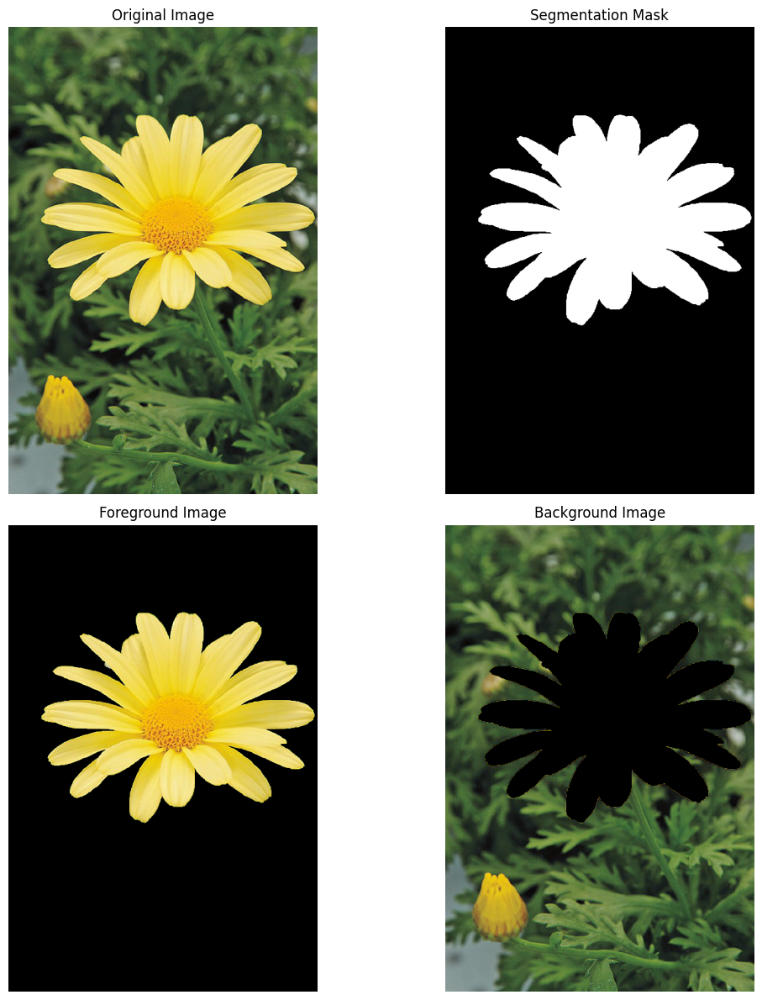

In [22]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Read the image
img = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\Flower_01.png", cv.IMREAD_COLOR)

# Use grabCut to segment the image and Show the final segmentation mask, foreground image, and background image
mask = np.zeros(img.shape[:2], np.uint8)
bgdModel = np.zeros((1,65), np.float64)
fgdModel = np.zeros((1,65), np.float64)
rect = (50, 100, 500, 450)

cv.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv.GC_INIT_WITH_RECT)

mask2 = np.where((mask==2)|(mask==0), 0, 1).astype('uint8')

# Segment the foreground and background
img_fg = img * mask2[:,:,np.newaxis]
img_bg = img * (1 - mask2[:,:,np.newaxis])  
# img_bg = img - img_fg


# Display the original image and the segmented images
plt.figure(figsize=(12, 12))

plt.subplot(2,2,1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(2,2,3)
plt.imshow(cv.cvtColor(img_fg, cv.COLOR_BGR2RGB))
plt.title('Foreground Image')
plt.axis('off')

plt.subplot(2,2,4)
plt.imshow(cv.cvtColor(img_bg, cv.COLOR_BGR2RGB))
plt.title('Background Image')
plt.axis('off')

plt.subplot(2,2,2)
plt.imshow(mask2, cmap='gray')
plt.title('Segmentation Mask')
plt.axis('off')

plt.tight_layout()
plt.show()


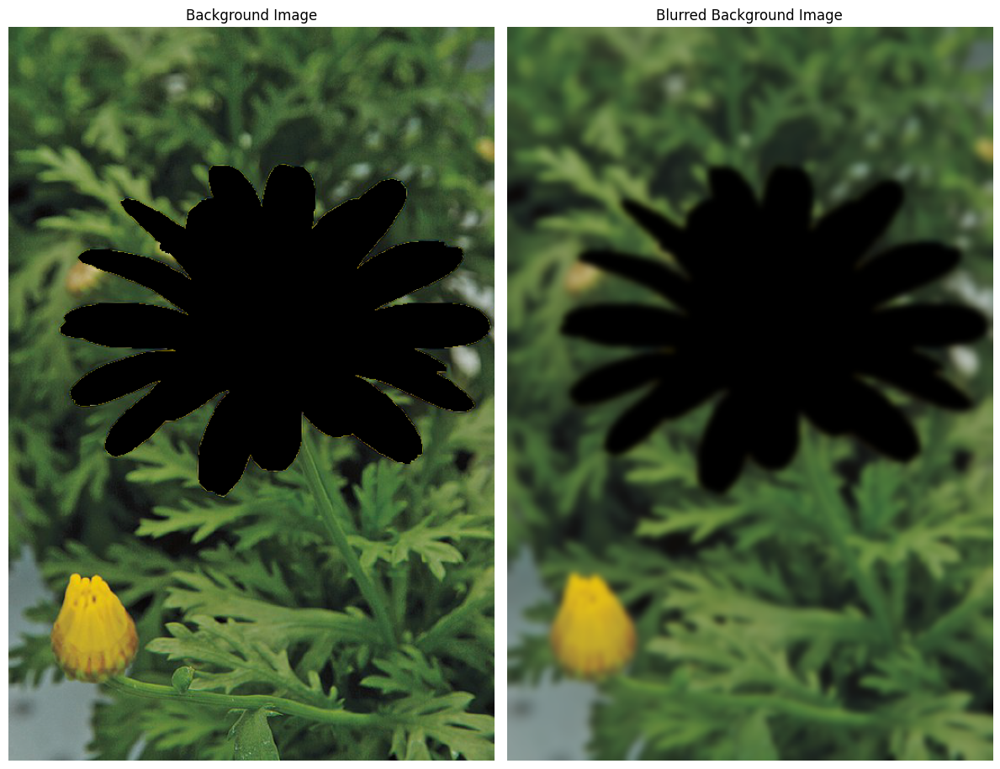

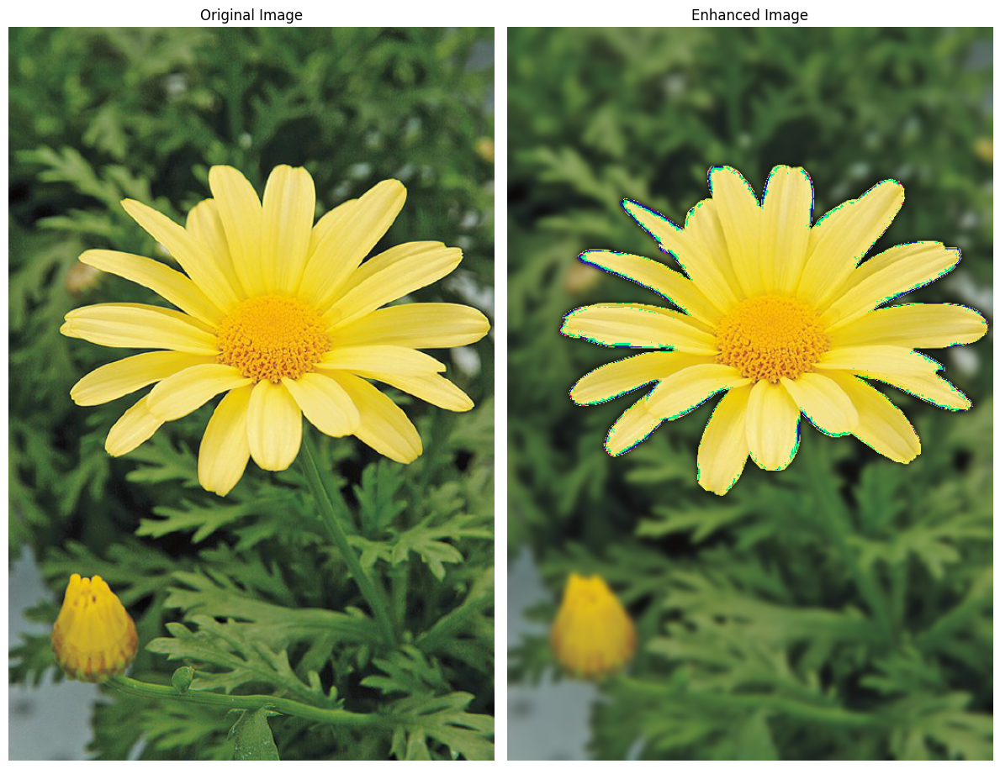

In [23]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Read the image
img = cv.imread(r"E:\UOM\Academic\Semester 5\Image processing and machine vision\Assignment 01\Flower_01.png", cv.IMREAD_COLOR)

# Use grabCut to segment the image and Show the final segmentation mask, foreground image, and background image
mask = np.zeros(img.shape[:2], np.uint8)
bgdModel = np.zeros((1,65), np.float64)
fgdModel = np.zeros((1,65), np.float64)
rect = (50, 100, 500, 450)

cv.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv.GC_INIT_WITH_RECT)

mask2 = np.where((mask==2)|(mask==0), 0, 1).astype('uint8')

# Segment the foreground and background
img_fg = img * mask2[:,:,np.newaxis]
# img_bg = img * (1 - mask2[:,:,np.newaxis])  
img_bg = img - img_fg

# Apply gaussian blur to the background image
img_bg_blur = cv.GaussianBlur(img_bg, (21, 21), 0)


# Display the blurred background
plt.figure(figsize=(12, 12))

plt.subplot(1,2,1)
plt.imshow(cv.cvtColor(img_bg, cv.COLOR_BGR2RGB))
plt.title('Background Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(cv.cvtColor(img_bg_blur, cv.COLOR_BGR2RGB))
plt.title('Blurred Background Image')
plt.axis('off')

plt.tight_layout()
plt.show()

# Combine the foreground and blurred background
img_final = img_fg + img_bg_blur

# Display the original image and the enhanced image
plt.figure(figsize=(12, 12))

plt.subplot(1,2,1)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(cv.cvtColor(img_final, cv.COLOR_BGR2RGB))
plt.title('Enhanced Image')
plt.axis('off')

plt.tight_layout()
plt.show()